In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os

In [2]:
from pathlib import Path
import json
from random import randint
from collections import Counter
from collections import defaultdict

In [3]:
import json 
from PIL import Image, ImageDraw
from IPython.display import display
from shapely import wkt
from shapely.geometry.multipolygon import MultiPolygon

In [28]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
from copy import copy 

%matplotlib inline
rcParams['figure.figsize'] = 30, 30
plt.rcParams['legend.title_fontsize'] = 14

In [29]:
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [49]:
def embed_map(m, file_name):
    from IPython.display import IFrame
    m.save(file_name)
    return IFrame(file_name, width='100%', height='500px')

In [54]:
labels_generator = Path('input').rglob(pattern=f'*post_*.json')

In [56]:
def get_disaster_dict(labels_generator):    
    disaster_dict = defaultdict(list)
    for label in labels_generator:
        disaster_type = label.name.split('_')[0]
        disaster_dict[disaster_type].append(str(label))
    return disaster_dict

In [57]:
disaster_dict = get_disaster_dict(labels_generator)

In [58]:
disaster_dict.keys()

dict_keys(['guatemala-volcano', 'hurricane-florence', 'hurricane-harvey', 'hurricane-matthew', 'hurricane-michael', 'mexico-earthquake', 'midwest-flooding', 'palu-tsunami', 'santa-rosa-wildfire', 'socal-fire'])

In [59]:
disaster_labels = disaster_dict['guatemala-volcano']

In [60]:
def read_label(label_path):
    with open(label_path) as json_file:
        image_json = json.load(json_file)
        return image_json

In [61]:
damage_dict = {
    "no-damage": (0, 255, 0, 50),
    "minor-damage": (0, 0, 255, 50),
    "major-damage": (255, 69, 0, 50),
    "destroyed": (255, 0, 0, 50),
    "un-classified": (255, 255, 255, 50)
}

In [62]:
def get_damage_type(properties):
    if 'subtype' in properties:
        return properties['subtype']
    else:
        return 'no-damage'

In [63]:
def annotate_img(draw, coords):
        wkt_polygons = []

        for coord in coords:
            damage = get_damage_type(coord['properties'])
            wkt_polygons.append((damage, coord['wkt']))

        polygons = []

        for damage, swkt in wkt_polygons:
            polygons.append((damage, wkt.loads(swkt)))

        for damage, polygon in polygons:
            x,y = polygon.exterior.coords.xy
            coords = list(zip(x,y))
            draw.polygon(coords, damage_dict[damage])

        del draw

In [64]:
def display_img(json_path, time='post', annotated=True):
    if time=='pre':
        json_path = json_path.replace('post', 'pre')
        
    img_path = json_path.replace('labels', 'images').replace('json','png')
        
    image_json = read_label(json_path)
    img_name = image_json['metadata']['img_name']
        
    print(img_name)
    
    img = Image.open(img_path)
    draw = ImageDraw.Draw(img, 'RGBA')
    
    if annotated:
        annotate_img(draw, image_json['features']['xy'])

    return img

In [65]:
def plot_image(label):

    # read images
    img_A = display_img(label, time='pre', annotated=False)
    img_B = display_img(label, time='post', annotated=False)
    img_C = display_img(label, time='pre', annotated=True)
    img_D = display_img(label, time='post', annotated=True)


    # display images
    fig, ax = plt.subplots(2,2)
    fig.set_size_inches(30, 30)
    TITLE_FONT_SIZE = 24
    ax[0][0].imshow(img_A);
    ax[0][0].set_title('Pre Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[0][1].imshow(img_B);
    ax[0][1].set_title('Post Diaster Image (Not Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][0].imshow(img_C);
    ax[1][0].set_title('Pre Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    ax[1][1].imshow(img_D);
    ax[1][1].set_title('Post Diaster Image (Annotated)', fontsize=TITLE_FONT_SIZE)
    plt.savefig('split_image.png', dpi = 100)
    plt.show()

In [66]:
disaster_labels[0]

'input\\xview2-challenge-dataset-tier-3-data\\tier3\\labels\\guatemala-volcano_00000003_post_disaster.json'

guatemala-volcano_00000003_post_disaster.png


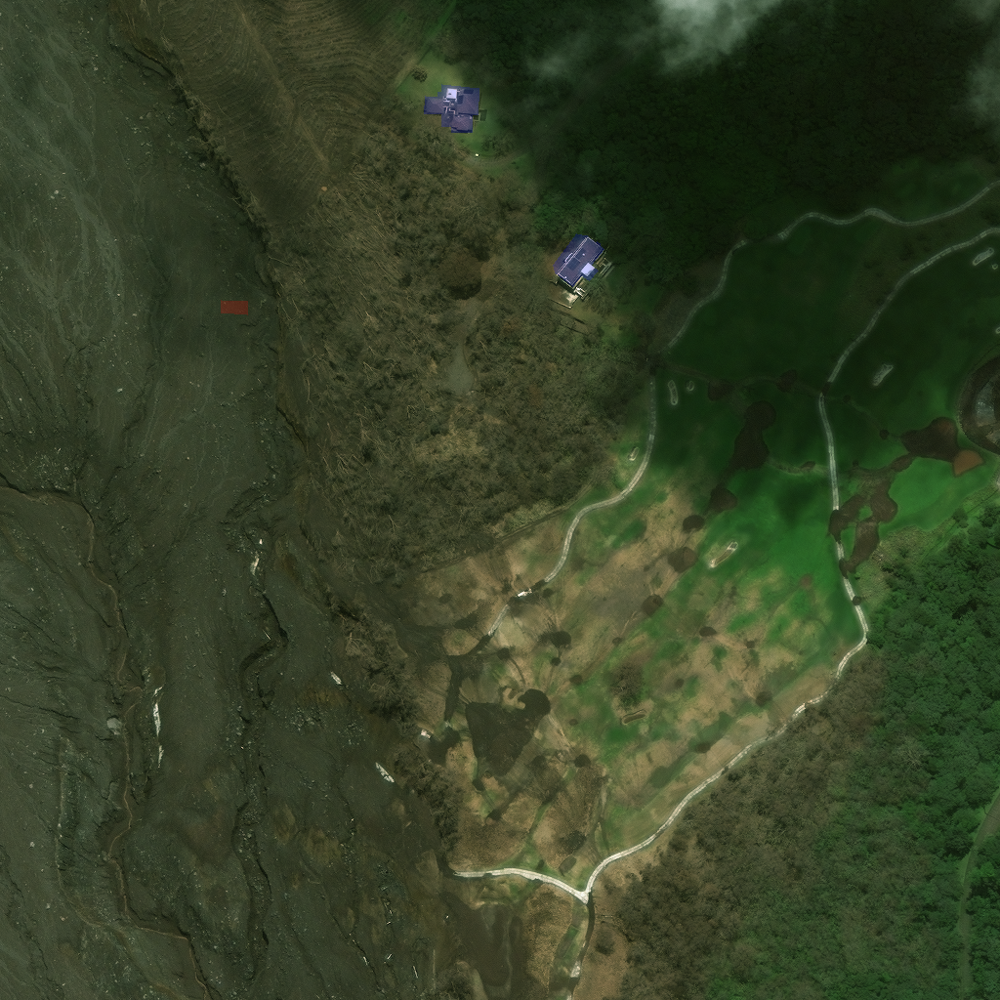

In [67]:
display_img(disaster_labels[0], time='post', annotated=True)

In [68]:
def get_centroid(coords):
    polygons = [ wkt.loads(polygon['wkt']) for polygon in coords ]
    centroid =  MultiPolygon(polygons).centroid
    try:
        return {'centroid_x': centroid.x, 'centroid_y': centroid.y, 'latlong': centroid }
    except IndexError as e:
        return {'centroid_x': None, 'centroid_y': None, 'latlong': None }

In [69]:
def get_damage_dict(coords):
    damage_list = [ get_damage_type(coord['properties']) for coord in coords]
    return Counter(damage_list)

In [70]:
def metadata_with_damage(label_path):
    data = read_label(label_path)
    coords = data['features']['lng_lat']
    
    damage_dict = get_damage_dict(coords)
    centroid = get_centroid(coords)
    
    data['metadata'].update(centroid)
    data['metadata']['path'] = label_path
    data['metadata'].update(damage_dict)
    return data['metadata']

In [71]:
def generate_metadata_df(disaster_labels):
    metadata_list = [metadata_with_damage(label_path) for label_path in disaster_labels]
    df = pd.DataFrame(metadata_list)
    return df.fillna(df.mean())

In [72]:
df = generate_metadata_df(disaster_labels)
sorted_df = df.sort_values(by=['destroyed'], ascending=False)

C:\Users\shrey\AppData\Local\Temp\ipykernel_28812\3743183164.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return df.fillna(df.mean())


In [73]:
sorted_df

,sensor,provider_asset_type,gsd,capture_date,off_nadir_angle,pan_resolution,sun_azimuth,sun_elevation,target_azimuth,disaster,...,id,img_name,centroid_x,centroid_y,latlong,path,minor-damage,destroyed,un-classified,no-damage
0,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE2Nw.m-DFlxQeMVNP1AiBYflHzPY-lgA,guatemala-volcano_00000003_post_disaster.png,-90.835348,14.437984,POINT (-90.83534822454484 14.43798374710012),input\xview2-challenge-dataset-tier-3-data\tie...,2.0,1.0,1.0,13.0
1,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE2OQ.-m3DWmnimXd3-kEuh5uQqyt4c3E,guatemala-volcano_00000005_post_disaster.png,-90.838508,14.443699,POINT (-90.83850843428343 14.443699467081672),input\xview2-challenge-dataset-tier-3-data\tie...,1.5,1.0,1.0,13.0
2,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE3Mw.nN5DQIYj7GaUrtF_FhxP6iV6mv8,guatemala-volcano_00000009_post_disaster.png,-90.811854,14.369694,POINT (-90.81185412313305 14.369694212017945),input\xview2-challenge-dataset-tier-3-data\tie...,1.5,1.0,1.0,3.0
3,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE3NQ.ffRyp8ivSpLLR44friq8665jspU,guatemala-volcano_00000011_post_disaster.png,-90.813320,14.443930,POINT (-90.81332041875751 14.443929878533568),input\xview2-challenge-dataset-tier-3-data\tie...,1.0,1.0,1.0,13.0
4,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE4NQ.7BE7WVgAi5LqckJ7Q8uIPbWrzC0,guatemala-volcano_00000021_post_disaster.png,-90.809972,14.494636,POINT (-90.80997174501614 14.494636218196067),input\xview2-challenge-dataset-tier-3-data\tie...,1.5,1.0,1.0,23.0
5,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE2Nw.m-DFlxQeMVNP1AiBYflHzPY-lgA,guatemala-volcano_00000003_post_disaster.png,-90.835348,14.437984,POINT (-90.83534822454484 14.43798374710012),input\xview2-challenge-dataset-train-and-test\...,2.0,1.0,1.0,13.0
6,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE2OQ.-m3DWmnimXd3-kEuh5uQqyt4c3E,guatemala-volcano_00000005_post_disaster.png,-90.838508,14.443699,POINT (-90.83850843428343 14.443699467081672),input\xview2-challenge-dataset-train-and-test\...,1.5,1.0,1.0,13.0
7,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE3Mw.nN5DQIYj7GaUrtF_FhxP6iV6mv8,guatemala-volcano_00000009_post_disaster.png,-90.811854,14.369694,POINT (-90.81185412313305 14.369694212017945),input\xview2-challenge-dataset-train-and-test\...,1.5,1.0,1.0,3.0
8,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE3NQ.ffRyp8ivSpLLR44friq8665jspU,guatemala-volcano_00000011_post_disaster.png,-90.813320,14.443930,POINT (-90.81332041875751 14.443929878533568),input\xview2-challenge-dataset-train-and-test\...,1.0,1.0,1.0,13.0
9,WORLDVIEW03_VNIR,WORLDVIEW03_VNIR,1.408524,2018-06-22T16:55:40.000Z,21.97336,0.351739,58.571484,71.182274,314.29373,guatemala-volcano,...,MjU0NzE4NQ.7BE7WVgAi5LqckJ7Q8uIPbWrzC0,guatemala-volcano_00000021_post_disaster.png,-90.809972,14.494636,POINT (-90.80997174501614 14.494636218196067),input\xview2-challenge-dataset-train-and-test\...,1.5,1.0,1.0,23.0


In [74]:
df_generator = sorted_df.iterrows()

In [75]:
from IPython.core.display import display, HTML
def generate_gmaps_link(lat, long):
    link = f"https://www.google.com/maps/@?api=1&map_action=map&center={lat},{long}&zoom=18&basemap=satellite"
    return HTML(f"""<a href="{link}" target="_blank">{link}</a>""")

C:\Users\shrey\AppData\Local\Temp\ipykernel_28812\2490155097.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [76]:
index, row = next(df_generator)

In [77]:
generate_gmaps_link(row.centroid_y, row.centroid_x)

In [79]:
row[['no-damage', 'minor-damage', 'destroyed', 'un-classified']]

no-damage        13.0
minor-damage      2.0
destroyed         1.0
un-classified     1.0
Name: 0, dtype: object

guatemala-volcano_00000003_pre_disaster.png


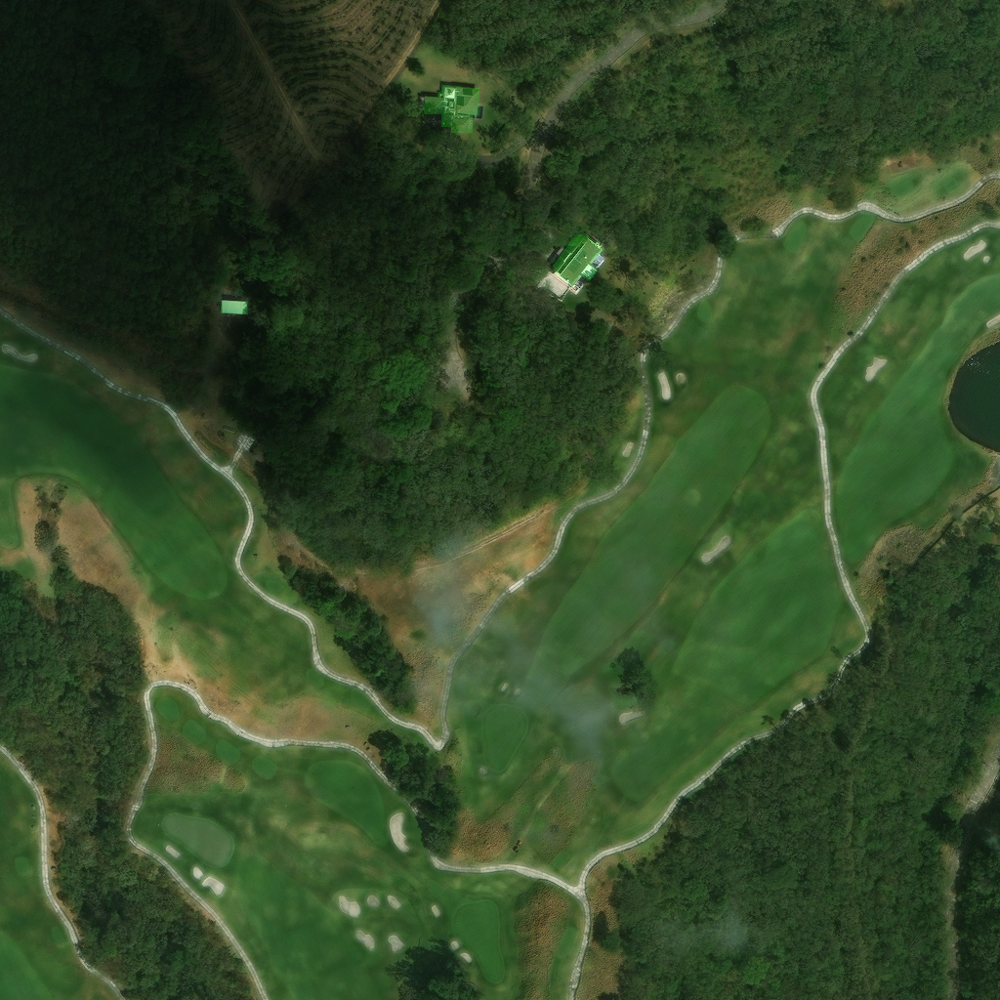

In [80]:
display_img(row.path, time='pre', annotated=True)

guatemala-volcano_00000003_post_disaster.png


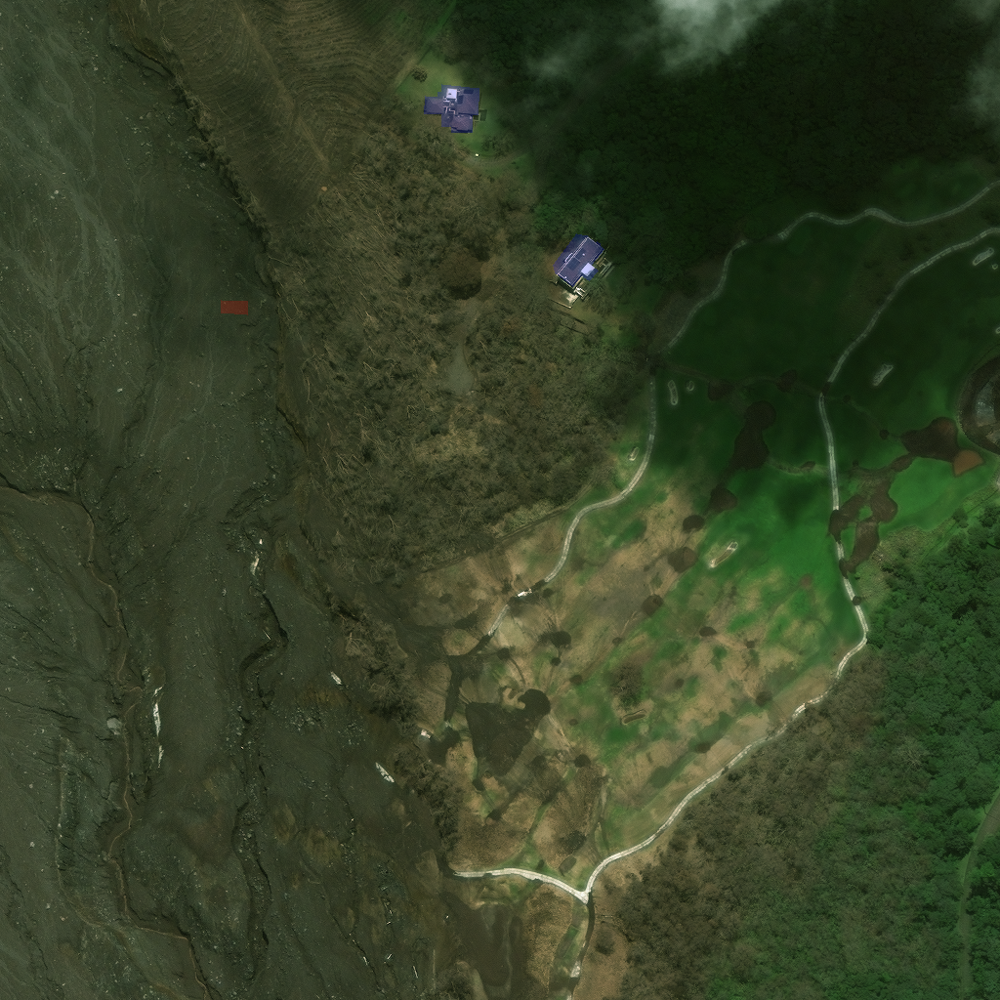

In [81]:
display_img(row.path, time='post', annotated=True)

guatemala-volcano_00000003_pre_disaster.png
guatemala-volcano_00000003_post_disaster.png
guatemala-volcano_00000003_pre_disaster.png
guatemala-volcano_00000003_post_disaster.png


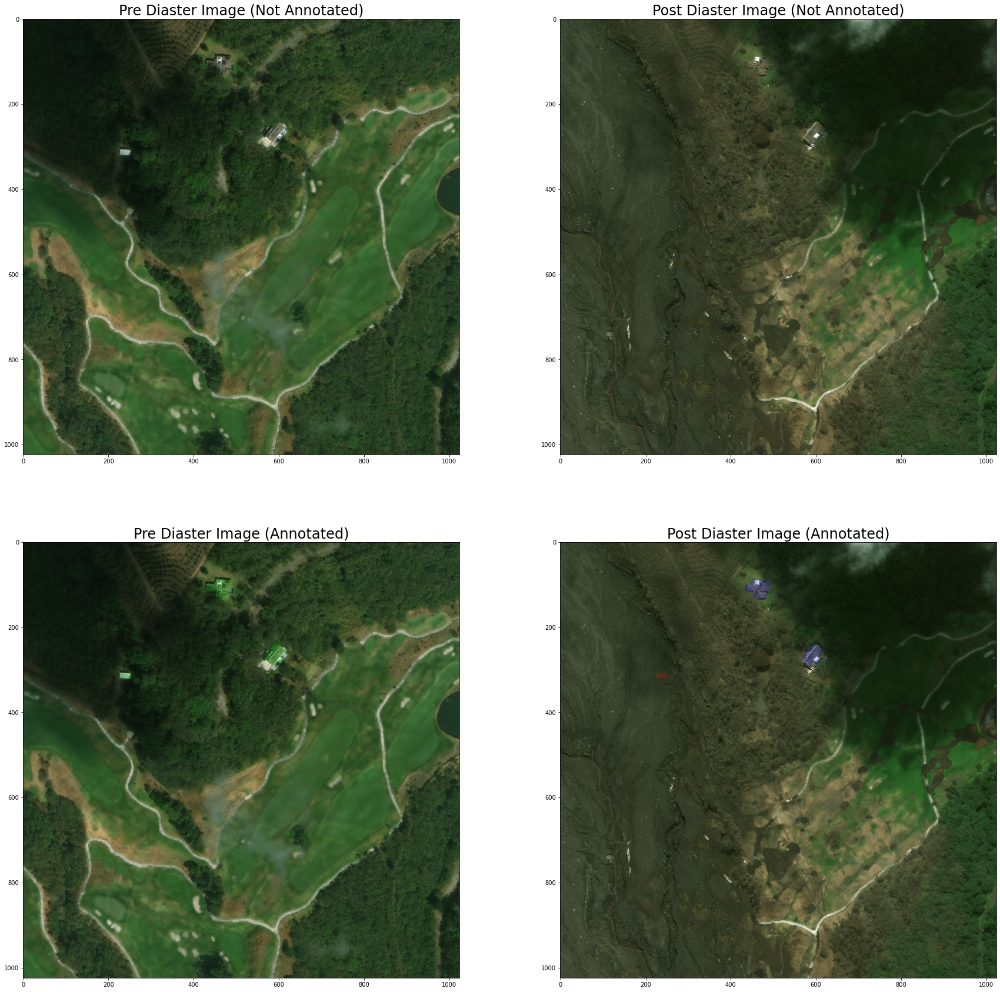

In [82]:
plot_image(row.path)

In [86]:
def generate_circle(row):
    
    COLOR_MAP = {
        "no-damage": 'green',
        "minor-damage": 'blue',
        "destroyed": 'red',
        "un-classified": 'black'
    }
    
    for damage_type, color in COLOR_MAP.items():
        yield Circle(
            location=row.loc[['centroid_y','centroid_x']].tolist(),
            radius=row.loc[damage_type],
            color=color)

In [87]:
location = df.mean().loc[['centroid_y','centroid_x']].tolist()

C:\Users\shrey\AppData\Local\Temp\ipykernel_28812\2810632771.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  location = df.mean().loc[['centroid_y','centroid_x']].tolist()


In [88]:
m_2 = folium.Map(location=location, tiles='openstreetmap', zoom_start=13)

# Add points to the map
for idx, row in df.iterrows():
    generator = generate_circle(row)
    for circle in generator:
        circle.add_to(m_2)

# Display the map
embed_map(m_2, 'm_2.html')

In [89]:
labels_generator = Path('../input').rglob(pattern=f'*.json')
full_df = generate_metadata_df(labels_generator)

In [90]:
def plot_bargraph(df, x, y, agg_func):
  new_df = df.groupby('disaster', as_index=False).agg(agg_func)

  for index, row in new_df.iterrows():
    plt.bar(row.disaster, row.gsd, label=row.disaster, align='center')
    
#   plt.legend(loc=1,prop={'size':18})

  plt.xticks(fontsize=22, rotation=90)
  fig = plt.gcf()
  fig.set_size_inches(30, 30)
  plt.savefig(f'{agg_func}.png', dpi=100)
  plt.show()